# Data Exploration for Data on Police Incident Reports in San Francisco County
Using data from data.sfgov.org on Police Incident Reports from 2018 – Present, we're going to investigate the most common crimes in SF County and the neighborhoods with the most reported incidents. 

## Importing Libraries

In [1]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import osmnx as ox
import folium
import plotly.express as px
from sodapy import Socrata
from keplergl import KeplerGl

## Querying Data from Socrata Run API 
Given how large the dataset for incident reports between 2018 and Present day, we decided to pull the data from the SF government's API. However, you'll notice that we encountered some challenges in doing so....

In [2]:
# Querrying data from Socrata using the max limit of 50,000, but I want to be able to use the "where" command to filter the data before I bring it in. 
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit = 50000,
                                )
df_crime = pd.DataFrame.from_records(results_crime)

In [3]:
# Check dimensions
df_crime.shape

(50000, 36)

In [4]:
# Check to see the initial data that's brought in
df_crime.head(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,:@computed_region_qgnn_b9vv,:@computed_region_26cr_cadq,:@computed_region_ajp5_b2md,:@computed_region_6pnf_4xz7,filed_online,:@computed_region_nqbw_i6c3,:@computed_region_h4ep_8xdi,:@computed_region_2dwj_jsy4,:@computed_region_y6ts_4iup,:@computed_region_jg9y_a9du
0,2020-08-15T12:43:00.000,2020-08-15T00:00:00.000,12:43,2020,Saturday,2020-08-15T12:58:00.000,95308704134,953087,200490354,202281583,...,9,1,7,2,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-18T19:00:00.000,2018-01-18T00:00:00.000,19:00,2018,Thursday,2018-01-22T16:59:00.000,64999771000,649997,186068683,NaN,...,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN
2,2020-08-16T03:13:00.000,2020-08-16T00:00:00.000,03:13,2020,Sunday,2020-08-16T03:14:00.000,95319604083,953196,200491669,202290313,...,2,9,26,2,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-08-16T03:38:00.000,2020-08-16T00:00:00.000,03:38,2020,Sunday,2020-08-16T04:56:00.000,95326228100,953262,200491738,202290404,...,3,2,20,2,NaN,3,NaN,NaN,NaN,NaN
4,2020-08-15T09:40:00.000,2020-08-15T00:00:00.000,09:40,2020,Saturday,2020-08-15T18:21:00.000,95322706244,953227,206121692,NaN,...,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,NaN,NaN


## Troubles querrying with more than one "where" command
I want to query data from Socrata that shows me incident reports for the year 2019, but only for those reports categorized as specific crimes. Specifically, we want: Larceny Theft, Assault, Burglary, Motor Vehicle Theft, Robbery, Offences Against The Family and Children, Weapons Offense, Arson, Sex Offense, Family Offense, Vandalism, Rape, and Homicide. 

In [5]:
# trying to figure out how to use the "where" command to get 2019 incident report data on certain types of crime
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit = 50000,
                                 where = "incident_year = '2019' and incident_category IN ('Arson')"
                                )
df_crime = pd.DataFrame.from_records(results_crime)

In [6]:
# Check dimensions....looks like our dataframe got smaller, which is good!
df_crime.shape

(313, 25)

In [7]:
# I only want data from the year 2019...success!
df_crime['incident_year'].value_counts()

2019    313
Name: incident_year, dtype: int64

In [8]:
# I only want data on incidents categorized as arson...success!
df_crime['incident_category'].value_counts()

Arson    313
Name: incident_category, dtype: int64

In [9]:
# By pulling a random sample of 5 rows, I can tell that my where command successfully worked!
df_crime.sample(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,incident_description,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point
204,2019-09-13T08:00:00.000,2019-09-13T00:00:00.000,08:00,2019,Friday,2019-09-17T13:15:00.000,84801926030,848019,190694737,192602174,...,Arson,Open or Active,THOMAS AVE \ JENNINGS ST,20150000,Bayview,Bayview Hunters Point,10,37.72829372549084,-122.38755070874484,"{'latitude': '37.72829372549084', 'longitude':..."
257,2019-11-04T14:01:00.000,2019-11-04T00:00:00.000,14:01,2019,Monday,2019-11-04T14:34:00.000,86625126029,866251,190834488,193081938,...,"Arson, Attempted",Cite or Arrest Adult,OFARRELL ST \ SHANNON ST,24944000,Tenderloin,Tenderloin,6,37.78589292711297,-122.41214750780264,"{'latitude': '37.78589292711297', 'longitude':..."
41,2019-02-18T18:30:00.000,2019-02-18T00:00:00.000,18:30,2019,Monday,2019-02-18T18:37:00.000,77139426030,771394,190122528,190493096,...,Arson,Open or Active,FONT BLVD \ CHUMASERO DR,33479000,Taraval,Lakeshore,7,37.71501138834774,-122.47299095912123,"{'latitude': '37.71501138834774', 'longitude':..."
113,2019-06-09T22:17:00.000,2019-06-09T00:00:00.000,22:17,2019,Sunday,2019-06-09T22:17:00.000,80996426032,809964,190415652,191603821,...,"Arson, Commercial Building",Open or Active,26TH ST \ KANSAS ST,23715000,Bayview,Bayview Hunters Point,10,37.750580761479114,-122.40218351932117,"{'latitude': '37.750580761479114', 'longitude'..."
198,2019-09-04T23:50:00.000,2019-09-04T00:00:00.000,23:50,2019,Wednesday,2019-09-12T08:00:00.000,84584426031,845844,190660766,192474801,...,Arson of Vehicle,Open or Active,SELBY ST \ QUESADA AVE,20756000,Bayview,Bayview Hunters Point,10,37.73864877116737,-122.40080826801052,"{'latitude': '37.73864877116737', 'longitude':..."


## Retrying after some help from Yoh
I had some trouble getting the "where" command to successfully query data for more than one incident category, so I sent this notebook to Yoh for some help on querying data using sodapy, lets implement some of his suggestions. 

In [10]:
# Import libraries
import pandas as pd
import geopandas as gpd
import contextily as ctx
import osmnx as ox
import folium
import plotly.express as px
from sodapy import Socrata
from keplergl import KeplerGl

In [11]:
# Query data from data.sfgov.org API and include "IN" command to include several incident categories, and entire argument inside ""
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Larceny Theft','Arson','Assault','Burglary','Sex Offense','Homicide','Motor Vehicle Theft','Robbery','Offences Against The Family and Children','Family Offenses','Vandalism','Rape','Weapons Offense')"
                                )
df_crime_all = pd.DataFrame.from_records(results_crime)
df_crime_all.shape

(50000, 26)

In [12]:
# Check to see if query worked...success!
df_crime_all['incident_category'].value_counts()

Larceny Theft          32446
Assault                 6271
Burglary                4172
Motor Vehicle Theft     3624
Robbery                 2245
Weapons Offense          592
Sex Offense              278
Arson                    201
Vandalism                136
Rape                      25
Homicide                  10
Name: incident_category, dtype: int64

In [13]:
# Check to see if query worked for data from 2019 only...success!
df_crime_all['incident_year'].value_counts()

2019    50000
Name: incident_year, dtype: int64

## Let's begin mapping our data!
Using Geopandas, we create a map of police report incidents in SF County.

In [14]:
# first, you have to convert the dataframe into a geodataframe
crime_gdf = gpd.GeoDataFrame(
    df_crime_all, geometry=gpd.points_from_xy(df_crime_all.longitude, df_crime_all.latitude))

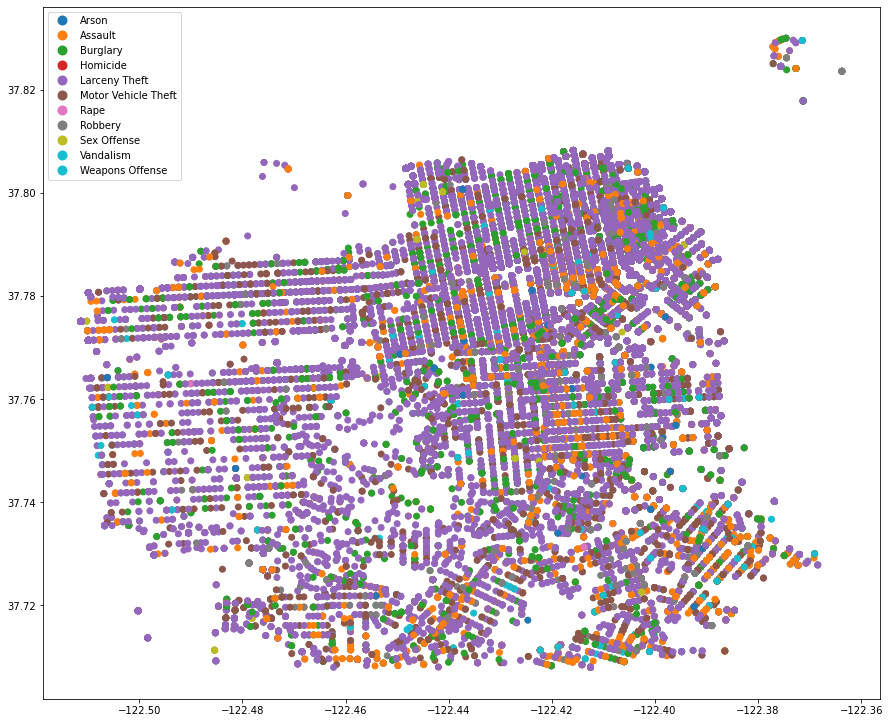

In [15]:
# Plot the data
ax = crime_gdf.plot(figsize=(15,15),
                   column='incident_category',
                   legend=True)

## Addressing the query limit with Socrata/Sodapy
Since there is a 50,000 limit set for querying Socrata data, not all of the crimes from 2018 are represented. We're going to see if I can query chunks of different data sets and then merge them into one geopandas plot. 

### I know that Larceny Theft is the most common incident from the .value_counts() command ran above, so let me query data on Larceny Theft alone and see if it falls below the query limit. 

In [16]:
# Query data from data.sf.gov.org using Socrata
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Larceny Theft')"
                                )
df_crime_LT = pd.DataFrame.from_records(results_crime)
df_crime_LT.shape

(48881, 26)

### There are 48,881 Larceny Theft reports in 2019, just below the 50,000 query limit. Let's leave this dataset to just be Larceny Theft reports. 

In [17]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_category'].value_counts()

Larceny Theft    48881
Name: incident_category, dtype: int64

In [18]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_year'].value_counts()

2019    48881
Name: incident_year, dtype: int64

### Now lets see if we can lump all the other incident types into one dataframe that doesn't exceed the query limit. 

In [19]:
client_crime2 = Socrata ("data.sfgov.org", None)
results_crime2 = client_crime2.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Arson','Assault','Burglary','Sex Offense','Homicide','Motor Vehicle Theft','Robbery','Offences Against The Family and Children','Family Offenses','Vandalism','Rape','Weapons Offense')"
                                  )
df_crime_multiple = pd.DataFrame.from_records(results_crime2)
df_crime_multiple.shape

(25564, 26)

#### 25,564 incident reports, which is below the limit! Now lets see if the query pulled in the data we wanted. 

In [20]:
# Check that query brought in the data for the categories we wanted...success!
df_crime_multiple['incident_category'].value_counts()

Assault                8892
Burglary               6042
Motor Vehicle Theft    5389
Robbery                3455
Weapons Offense         777
Sex Offense             445
Arson                   313
Vandalism               198
Rape                     38
Homicide                 15
Name: incident_category, dtype: int64

## Make Geopandas Maps for Both Data Frames
Let's map both dataframes. One for df_crime_LT and one for df_crime_multiple

In [21]:
# Convert dataframe to a GeoDataFrame
crime_LT_gdf=gpd.GeoDataFrame(
    df_crime_LT, geometry=gpd.points_from_xy(df_crime_LT.longitude, df_crime_LT.latitude))

In [22]:
# Convert dataframe to a GeoDataFrame
crime_multiple_gdf=gpd.GeoDataFrame(
    df_crime_multiple, geometry=gpd.points_from_xy(df_crime_multiple.longitude, df_crime_multiple.latitude))

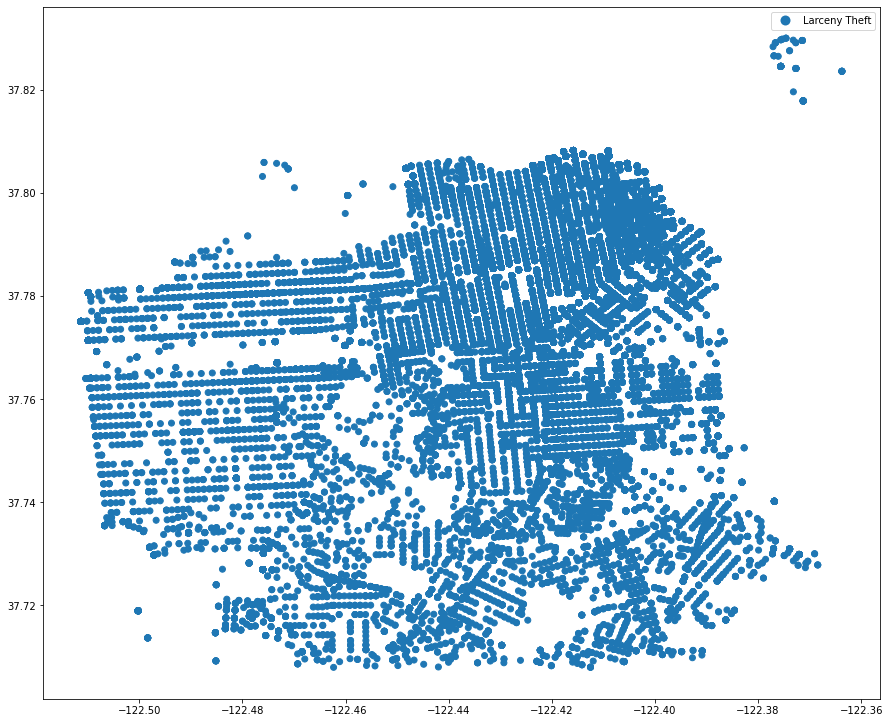

In [23]:
# Plot the dataframe on just Larceny Theft reports
ax = crime_LT_gdf.plot(figsize=(15,15),
                      column='incident_category',
                      legend=True)

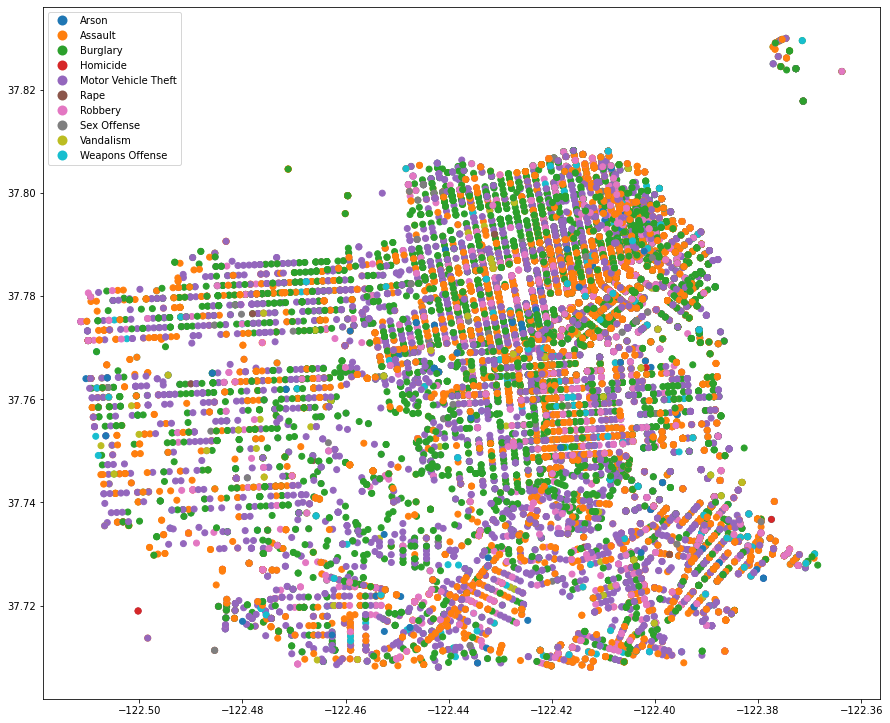

In [24]:
# Plot the dataframe on all other incident types
ax = crime_multiple_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)

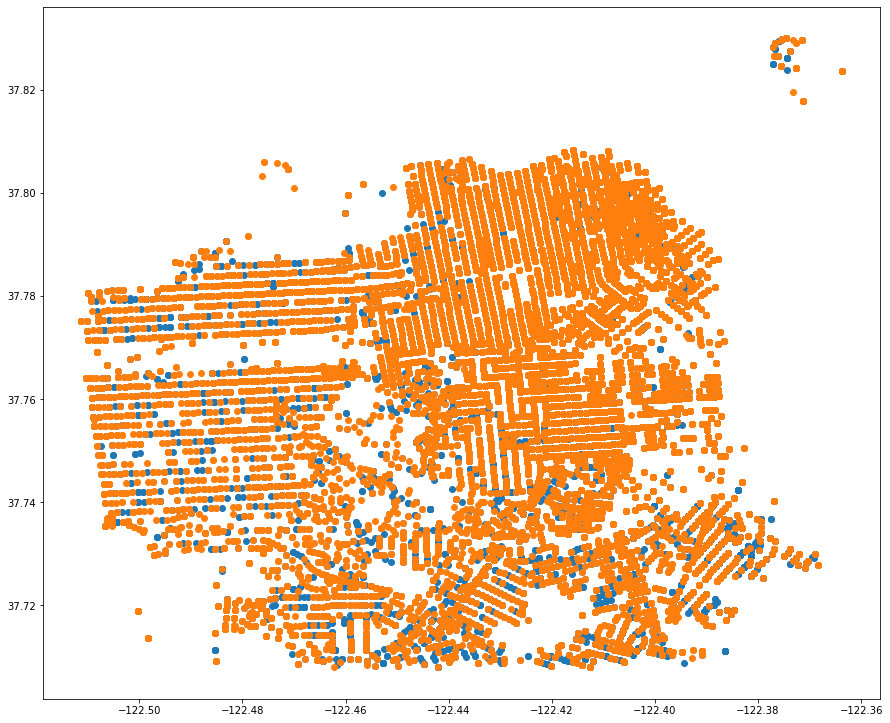

In [25]:
# Merge the two plots into one by adding creating a plot with two layers
fig, ax = plt.subplots(figsize=(15, 15))
crime_multiple_gdf.plot(ax=ax)
crime_LT_gdf.plot(ax=ax)

## Almost there! It looks like the data frame with multiple crimes are all marked by one-colored dot, and not color coded like it was before. Lets see what we can do about this. 

### After doing some research, we weren't able to find an easy way to color code the dots for individual values of a two-layered map, so we decided to go about it by creating a different layer for each incident category

In [26]:
# Separating each incident category into its own data frame...there's probably a function/for loop for this, but I'm not quite sure how to go about that. Would love more practice for that in class. 
client_crime_Arson = Socrata ("data.sfgov.org", None)
results_crime_Arson = client_crime_Arson.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Arson')"
                                  )
df_crime_Arson = pd.DataFrame.from_records(results_crime_Arson)
df_crime_Arson.shape

(313, 25)

In [27]:
client_crime_Assault = Socrata ("data.sfgov.org", None)
results_crime_Assault = client_crime_Assault.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Assault')"
                                  )
df_crime_Assault = pd.DataFrame.from_records(results_crime_Assault)
df_crime_Assault.shape

(8892, 25)

In [28]:
client_crime_Burglary = Socrata ("data.sfgov.org", None)
results_crime_Burglary = client_crime_Burglary.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Burglary')"
                                  )
df_crime_Burglary = pd.DataFrame.from_records(results_crime_Burglary)
df_crime_Burglary.shape

(6042, 26)

In [29]:
client_crime_Sex_Offense = Socrata ("data.sfgov.org", None)
results_crime_Sex_Offense = client_crime_Sex_Offense.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Sex Offense')"
                                  )
df_crime_Sex_Offense = pd.DataFrame.from_records(results_crime_Sex_Offense)
df_crime_Sex_Offense.shape

(445, 25)

In [30]:
client_crime_Homicide = Socrata ("data.sfgov.org", None)
results_crime_Homicide = client_crime_Homicide.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Homicide')"
                                  )
df_crime_Homicide = pd.DataFrame.from_records(results_crime_Homicide)
df_crime_Homicide.shape

(15, 25)

In [31]:
client_crime_MVT = Socrata ("data.sfgov.org", None)
results_crime_MVT = client_crime_MVT.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Motor Vehicle Theft')"
                                  )
df_crime_MVT = pd.DataFrame.from_records(results_crime_MVT)
df_crime_MVT.shape

(5389, 25)

In [32]:
client_crime_Robbery = Socrata ("data.sfgov.org", None)
results_crime_Robbery = client_crime_Robbery.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Robbery')"
                                  )
df_crime_Robbery = pd.DataFrame.from_records(results_crime_Robbery)
df_crime_Robbery.shape

(3455, 25)

In [33]:
client_crime_OATFC = Socrata ("data.sfgov.org", None)
results_crime_OATFC = client_crime_OATFC.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Offences Against The Family and Children')"
                                  )
df_crime_OATFC = pd.DataFrame.from_records(results_crime_OATFC)
df_crime_OATFC.shape

(0, 0)

In [34]:
client_crime_FO = Socrata ("data.sfgov.org", None)
results_crime_FO = client_crime_FO.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Family Offense')"
                                  )
df_crime_FO = pd.DataFrame.from_records(results_crime_FO)
df_crime_FO.shape

(182, 25)

In [35]:
client_crime_Vandalism = Socrata ("data.sfgov.org", None)
results_crime_Vandalism = client_crime_Arson.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Vandalism')"
                                  )
df_crime_Vandalism = pd.DataFrame.from_records(results_crime_Vandalism)
df_crime_Vandalism.shape

(198, 25)

In [36]:
client_crime_Rape = Socrata ("data.sfgov.org", None)
results_crime_Rape = client_crime_Arson.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Rape')"
                                  )
df_crime_Rape = pd.DataFrame.from_records(results_crime_Rape)
df_crime_Rape.shape

(38, 25)

In [37]:
client_crime_WO = Socrata ("data.sfgov.org", None)
results_crime_WO = client_crime_Arson.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Weapons Offense')"
                                  )
df_crime_WO = pd.DataFrame.from_records(results_crime_WO)
df_crime_WO.shape

(777, 25)

In [38]:
# Now convert each data frame into a GeoDataFrame
# Since there were no incident reports for Offences Against the Family and Children, we don't need to convert that into a GeoDataFrame and include in our plot
crime_Arson_gdf=gpd.GeoDataFrame(
    df_crime_Arson, geometry=gpd.points_from_xy(df_crime_Arson.longitude, df_crime_Arson.latitude))
crime_Assault_gdf=gpd.GeoDataFrame(
    df_crime_Assault, geometry=gpd.points_from_xy(df_crime_Assault.longitude, df_crime_Assault.latitude))
crime_Burglary_gdf=gpd.GeoDataFrame(
    df_crime_Burglary, geometry=gpd.points_from_xy(df_crime_Burglary.longitude, df_crime_Burglary.latitude))
crime_Sex_Offense_gdf=gpd.GeoDataFrame(
    df_crime_Sex_Offense, geometry=gpd.points_from_xy(df_crime_Sex_Offense.longitude, df_crime_Sex_Offense.latitude))
crime_Homicide_gdf=gpd.GeoDataFrame(
    df_crime_Homicide, geometry=gpd.points_from_xy(df_crime_Homicide.longitude, df_crime_Homicide.latitude))
crime_MVT_gdf=gpd.GeoDataFrame(
    df_crime_MVT, geometry=gpd.points_from_xy(df_crime_MVT.longitude, df_crime_MVT.latitude))
crime_Robbery_gdf=gpd.GeoDataFrame(
    df_crime_Robbery, geometry=gpd.points_from_xy(df_crime_Robbery.longitude, df_crime_Robbery.latitude))
crime_FO_gdf=gpd.GeoDataFrame(
    df_crime_FO, geometry=gpd.points_from_xy(df_crime_FO.longitude, df_crime_FO.latitude))
crime_Vandalism_gdf=gpd.GeoDataFrame(
    df_crime_Vandalism, geometry=gpd.points_from_xy(df_crime_Vandalism.longitude, df_crime_Vandalism.latitude))
crime_Rape_gdf=gpd.GeoDataFrame(
    df_crime_Rape, geometry=gpd.points_from_xy(df_crime_Rape.longitude, df_crime_Rape.latitude))
crime_WO_gdf=gpd.GeoDataFrame(
    df_crime_WO, geometry=gpd.points_from_xy(df_crime_WO.longitude, df_crime_WO.latitude))

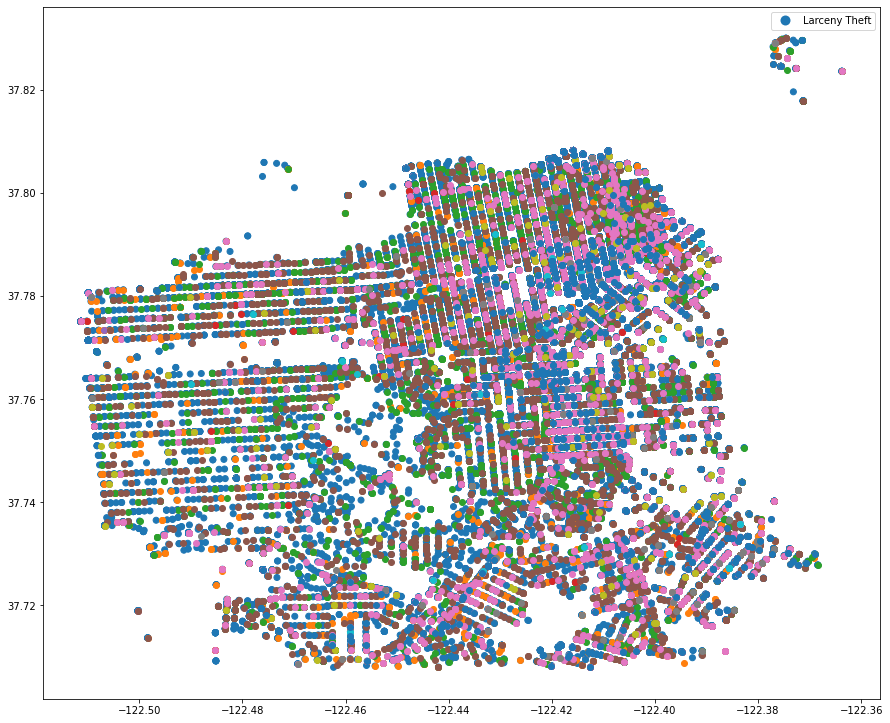

In [39]:
# Use subplot function to create multiple data layers
fig, ax = plt.subplots(figsize=(15, 15))
crime_LT_gdf.plot(ax=ax, column='incident_category', legend=True)
crime_Arson_gdf.plot(ax=ax)
crime_Assault_gdf.plot(ax=ax)
crime_Burglary_gdf.plot(ax=ax)
crime_Sex_Offense_gdf.plot(ax=ax)
crime_Homicide_gdf.plot(ax=ax)
crime_MVT_gdf.plot(ax=ax)
crime_Robbery_gdf.plot(ax=ax)
crime_FO_gdf.plot(ax=ax)
crime_Vandalism_gdf.plot(ax=ax)
crime_Rape_gdf.plot(ax=ax)
crime_WO_gdf.plot(ax=ax)

<div class="alert alert-info">

I wasn't able to find out how to create a legend with all the subplots, need to explore this more. 

</div>

## Data Exploration 
Lets take a look at what the incident report data tells us. 

### Explaining the three datasets we have
Given that Socrata has a query limit of 50,000, we have three possible datasets that we can explore. 
1. 2019 dataset including all crime types of interest, but ommitting any incidents after 50,000 entries
2. 2019 dataset on just Larceny Theft, which consitutes the most commonly reported incident
3. 2019 dataset on crime types of interest, excluding Larceny Theft. 

#### 2019 Dataset Including All Crime Types

In [40]:
# Check dimensions
df_crime_all.shape

(50000, 27)

In [41]:
# What do the first few rows look like?
df_crime_all.head(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online,geometry
0,2019-01-01T12:00:00.000,2019-01-01T00:00:00.000,12:00,2019,Tuesday,2020-11-05T19:10:00.000,97586106381,975861,200669139,203102887,...,BRANNAN ST \ DELANCEY ST,23600000,Southern,Financial District/South Beach,6,37.783609175905454,-122.38984639339479,"{'latitude': '37.783609175905454', 'longitude'...",NaN,POINT (-122.38985 37.78361)
1,2019-01-01T12:00:00.000,2019-01-01T00:00:00.000,12:00,2019,Tuesday,2020-11-05T19:10:00.000,97586105013,975861,200669139,203102887,...,BRANNAN ST \ DELANCEY ST,23600000,Southern,Financial District/South Beach,6,37.783609175905454,-122.38984639339479,"{'latitude': '37.783609175905454', 'longitude'...",NaN,POINT (-122.38985 37.78361)
2,2019-01-01T00:00:00.000,2019-01-01T00:00:00.000,00:00,2019,Tuesday,2020-11-04T00:02:00.000,97595206372,975952,206154477,NaN,...,BERRY ST \ 05TH ST,23818000,Southern,Mission Bay,6,37.77403085060099,-122.39557666155538,"{'latitude': '37.77403085060099', 'longitude':...",True,POINT (-122.39558 37.77403)
3,2019-08-16T17:00:00.000,2019-08-16T00:00:00.000,17:00,2019,Friday,2020-01-31T15:17:00.000,97544306381,975443,200077930,200312404,...,UNION ST \ SCOTT ST,26873000,Northern,Marina,2,37.79646144154291,-122.44042174577214,"{'latitude': '37.79646144154291', 'longitude':...",NaN,POINT (-122.44042 37.79646)
4,2019-08-11T12:15:00.000,2019-08-11T00:00:00.000,12:15,2019,Sunday,2020-10-30T11:00:00.000,97397506364,973975,190588748,NaN,...,GEARY ST \ GRANT AVE,24655000,Central,Financial District/South Beach,3,37.787765494696465,-122.40504139998343,"{'latitude': '37.787765494696465', 'longitude'...",NaN,POINT (-122.40504 37.78777)


In [42]:
# What are the datatypes for each variable?
df_crime_all.dtypes

incident_datetime            object
incident_date                object
incident_time                object
incident_year                object
incident_day_of_week         object
report_datetime              object
row_id                       object
incident_id                  object
incident_number              object
cad_number                   object
report_type_code             object
report_type_description      object
incident_code                object
incident_category            object
incident_subcategory         object
incident_description         object
resolution                   object
intersection                 object
cnn                          object
police_district              object
analysis_neighborhood        object
supervisor_district          object
latitude                     object
longitude                    object
point                        object
filed_online                 object
geometry                   geometry
dtype: object

In [43]:
# Check overall info of dataframe
df_crime_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   incident_datetime        50000 non-null  object  
 1   incident_date            50000 non-null  object  
 2   incident_time            50000 non-null  object  
 3   incident_year            50000 non-null  object  
 4   incident_day_of_week     50000 non-null  object  
 5   report_datetime          50000 non-null  object  
 6   row_id                   50000 non-null  object  
 7   incident_id              50000 non-null  object  
 8   incident_number          50000 non-null  object  
 9   cad_number               32651 non-null  object  
 10  report_type_code         50000 non-null  object  
 11  report_type_description  50000 non-null  object  
 12  incident_code            50000 non-null  object  
 13  incident_category        50000 non-null  object  
 14  incide

In [44]:
# convert latitude and longitudes to float for future mapping
df_crime_all['latitude'] = df_crime_all['latitude'].astype(float)
df_crime_all['longitude'] = df_crime_all['longitude'].astype(float)
df_crime_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   incident_datetime        50000 non-null  object  
 1   incident_date            50000 non-null  object  
 2   incident_time            50000 non-null  object  
 3   incident_year            50000 non-null  object  
 4   incident_day_of_week     50000 non-null  object  
 5   report_datetime          50000 non-null  object  
 6   row_id                   50000 non-null  object  
 7   incident_id              50000 non-null  object  
 8   incident_number          50000 non-null  object  
 9   cad_number               32651 non-null  object  
 10  report_type_code         50000 non-null  object  
 11  report_type_description  50000 non-null  object  
 12  incident_code            50000 non-null  object  
 13  incident_category        50000 non-null  object  
 14  incide

In [45]:
# We don't need all those columns, so let's just pull out the relevant ones
desired_columns = ['incident_datetime', 'incident_category','incident_date','incident_time','incident_year','incident_day_of_week','incident_id','analysis_neighborhood','latitude','longitude','point','geometry']
df_crime_all[desired_columns]

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
1,2019-01-01T12:00:00.000,Burglary,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
2,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",POINT (-122.39558 37.77403)
3,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",POINT (-122.44042 37.79646)
4,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",POINT (-122.40504 37.78777)
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2019-09-15T09:03:00.000,Motor Vehicle Theft,2019-09-15T00:00:00.000,09:03,2019,Sunday,846864,Russian Hill,37.801481,-122.416133,"{'latitude': '37.80148085930786', 'longitude':...",POINT (-122.41613 37.80148)
49996,2019-09-15T10:58:00.000,Assault,2019-09-15T00:00:00.000,10:58,2019,Sunday,846865,South of Market,37.780006,-122.411933,"{'latitude': '37.780005867994824', 'longitude'...",POINT (-122.41193 37.78001)
49997,2019-09-15T11:30:00.000,Assault,2019-09-15T00:00:00.000,11:30,2019,Sunday,846867,Hayes Valley,37.774992,-122.437799,"{'latitude': '37.77499194694682', 'longitude':...",POINT (-122.43780 37.77499)
49998,2019-09-05T20:00:00.000,Larceny Theft,2019-09-05T00:00:00.000,20:00,2019,Thursday,846868,Mission,37.749717,-122.406896,"{'latitude': '37.74971662711626', 'longitude':...",POINT (-122.40690 37.74972)


In [46]:
# Create a new dataframe with just the columns of interest
df_crime_all = df_crime_all[desired_columns]
df_crime_all.head(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
1,2019-01-01T12:00:00.000,Burglary,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
2,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",POINT (-122.39558 37.77403)
3,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",POINT (-122.44042 37.79646)
4,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",POINT (-122.40504 37.78777)


In [47]:
# Pull some summary statistics
# Confirms that Larceny Theft is the most common (mode) incident report
df_crime_all['incident_category'].describe()

count             50000
unique               11
top       Larceny Theft
freq              32446
Name: incident_category, dtype: object

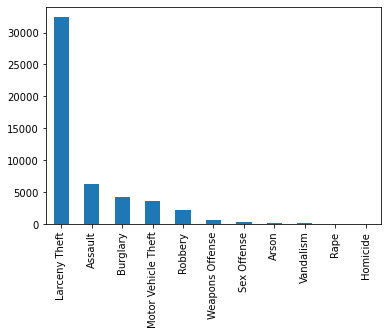

In [48]:
# Visualize the frequency of incident categories
df_crime_all['incident_category'].value_counts().plot.bar()

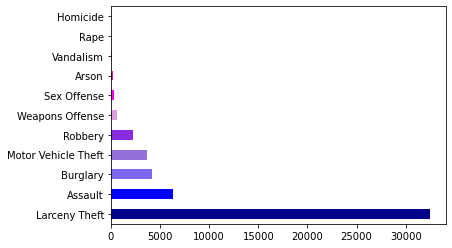

In [49]:
# Visualize it in a different way
df_crime_all['incident_category'].value_counts().plot.barh(color=['darkblue','blue','mediumslateblue','mediumpurple','blueviolet','plum','fuchsia','deeppink','hotpink','crimson','pink'])

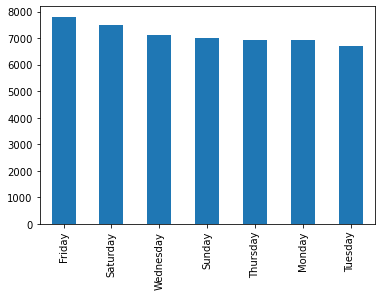

In [50]:
# What about the days of the week that incidents are reported? Visualize that frequency.
df_crime_all['incident_day_of_week'].value_counts().plot.bar()

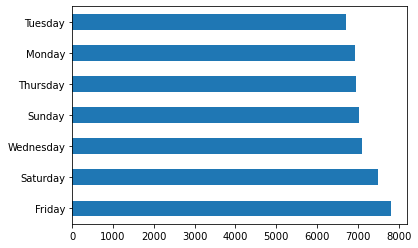

In [51]:
# Visualize it in a different way
df_crime_all['incident_day_of_week'].value_counts().plot.barh()

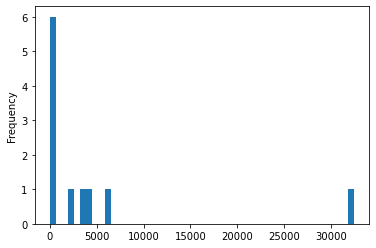

In [52]:
# Visualize it frequency of types of incidents in a different way...doesn't look as nice
df_crime_all['incident_category'].value_counts().plot.hist(bins=50)

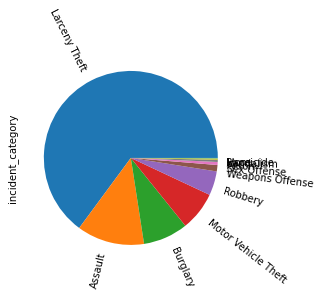

In [53]:
# Visualize it as a pie chart, but couldn't find out how to fix the labels. 
df_crime_all['incident_category'].value_counts().plot.pie(rotatelabels=True)

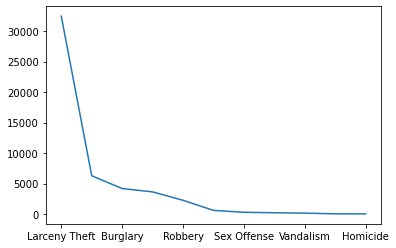

In [54]:
# Visualize frequency as a line chart 
df_crime_all['incident_category'].value_counts().plot.line()

In [55]:
# Group the data by type of incident to give me distinct values for each incident type (setting index as type of incident)
df_crime_all.groupby(['incident_category']).count()

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
incident_category,,,,,,,,,,,
Arson,201,201,201,201,201,201,201,201,201,201,201
Assault,6271,6271,6271,6271,6271,6271,6235,6235,6235,6235,6271
Burglary,4172,4172,4172,4172,4172,4172,4114,4114,4114,4114,4172
Homicide,10,10,10,10,10,10,9,9,9,9,10
Larceny Theft,32446,32446,32446,32446,32446,32446,29222,29222,29222,29222,32446
Motor Vehicle Theft,3624,3624,3624,3624,3624,3624,3560,3560,3560,3560,3624
Rape,25,25,25,25,25,25,25,25,25,25,25
Robbery,2245,2245,2245,2245,2245,2245,2225,2225,2225,2225,2245
Sex Offense,278,278,278,278,278,278,272,272,272,272,278


In [56]:
# Group by incidenty type and date of incident and give me a count 
df_crime_all_grouped=df_crime_all.groupby(['incident_category','incident_date']).count()
[['incident_id']]
df_crime_all_grouped.head(50)

incident_datetime  incident_time  \
incident_category incident_date                                               
Arson             2019-01-01T00:00:00.000                  1              1   
                  2019-01-02T00:00:00.000                  1              1   
                  2019-01-06T00:00:00.000                  3              3   
                  2019-01-08T00:00:00.000                  1              1   
                  2019-01-09T00:00:00.000                  1              1   
                  2019-01-10T00:00:00.000                  1              1   
                  2019-01-11T00:00:00.000                  1              1   
                  2019-01-12T00:00:00.000                  1              1   
                  2019-01-13T00:00:00.000                  3              3   
                  2019-01-14T00:00:00.000                  1              1   
                  2019-01-15T00:00:00.000                  1              1   
                  2019-01-19T00:00:00.000                  2              2   
                  2019-01-21T00:00:00.000                  1              1   
                  2019-01-22T00:00:00.000                  2              2   
                  2019-01-24T00:00:00.000                  1              1   
                  2019-01-25T00:00:00.000                  2              2   
                  2019-01-29T00:00:00.000                  2              2   
                  2019-02-01T00:00:00.000                  1              1   
                  2019-02-03T00:00:00.000                  2              2   
                  2019-02-07T00:00:00.000                  3              3   
                  2019-02-11T00:00:00.000                  1              1   
                  2019-02-14T00:00:00.000                  1              1   
                  2019-02-15T00:00:00.000                  1              1   
                  2019-02-17T00:00:00.000                  1              1   
                  2019-02-18T00:00:00.000                  2              2   
                  2019-02-19T00:00:00.000                  1              1   
                  2019-02-20T00:00:00.000                  1              1   
                  2019-02-23T00:00:00.000                  1              1   
                  2019-02-25T00:00:00.000                  1              1   
                  2019-02-27T00:00:00.000                  2              2   
                  2019-03-02T00:00:00.000                  1              1   
                  2019-03-06T00:00:00.000                  1              1   
                  2019-03-09T00:00:00.000                  2              2   
                  2019-03-10T00:00:00.000                  2              2   
                  2019-03-13T00:00:00.000                  3              3   
                  2019-03-15T00:00:00.000                  1              1   
                  2019-03-17T00:00:00.000                  1              1   
                  2019-03-22T00:00:00.000                  1              1   
                  2019-03-23T00:00:00.000                  1              1   
                  2019-03-26T00:00:00.000                  3              3   
                  2019-03-28T00:00:00.000                  1              1   
                  2019-03-29T00:00:00.000                  1              1   
                  2019-03-31T00:00:00.000                  1              1   
                  2019-04-01T00:00:00.000                  1              1   
                  2019-04-02T00:00:00.000                  1              1   
                  2019-04-05T00:00:00.000                  1              1   
                  2019-04-08T00:00:00.000                  2              2   
                  2019-04-09T00:00:00.000                  1              1   
                  2019-04-10T00:00:00.000                  1              1   
              

In [57]:
# Have to create a new column in a new dataframe called "count" that runs the .value_counts() function for incident types in each neighborhood analysis_neighborhood to plot using plotly
df_crime_all_count=df_crime_multiple.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_all_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,47
1,Arson,Bernal Heights,4
2,Arson,Castro/Upper Market,8
3,Arson,Chinatown,15
4,Arson,Excelsior,4


In [58]:
# Create a bar chart that represnts the type of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_all_count,
      x='analysis_neighborhood',
       y='count',
       color='incident_category',
      title='Number of Incident Reports in SF County by Neighborhood',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_category':'Type of Incident'})


In [59]:
# Lets convert our grouped dataframe into something more familiar 
df_crime_all_flat=df_crime_all_grouped.reset_index()
df_crime_all_flat

,incident_category,incident_date,incident_datetime,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,Arson,2019-01-01T00:00:00.000,1,1,1,1,1,1,1,1,1,1
1,Arson,2019-01-02T00:00:00.000,1,1,1,1,1,1,1,1,1,1
2,Arson,2019-01-06T00:00:00.000,3,3,3,3,3,3,3,3,3,3
3,Arson,2019-01-08T00:00:00.000,1,1,1,1,1,1,1,1,1,1
4,Arson,2019-01-09T00:00:00.000,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2015,Weapons Offense,2019-09-11T00:00:00.000,1,1,1,1,1,1,1,1,1,1
2016,Weapons Offense,2019-09-12T00:00:00.000,3,3,3,3,3,3,3,3,3,3
2017,Weapons Offense,2019-09-13T00:00:00.000,2,2,2,2,2,2,2,2,2,2
2018,Weapons Offense,2019-09-14T00:00:00.000,2,2,2,2,2,2,2,2,2,2


In [60]:
# Not sure why the count is coming up as 1 when I hover over each bar...
px.bar(df_crime_all_flat,
      x='incident_category',
      title='SF County Police Report Incidents',
      labels={'incident_category':'Incident Type'})

In [61]:
# Not sure why this is happening...
px.bar(df_crime_all,
      x='incident_day_of_week',
       color = 'incident_category',
      title='SF County Police Report Incidents')

#### Although I wasn't able to figure out these last two graphs, I was able to figure out how to group and plot the data which is reflected in the first graph. 

#### Dataset on Larceny Theft
Let's dig into the second dataset on just Larceny Theft

In [62]:
# Check dimensions
df_crime_LT.shape

(48881, 27)

In [63]:
# What do the first 5 rows look like?
df_crime_LT.head(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online,geometry
0,2019-01-01T12:00:00.000,2019-01-01T00:00:00.000,12:00,2019,Tuesday,2020-11-05T19:10:00.000,97586106381,975861,200669139,203102887,...,BRANNAN ST \ DELANCEY ST,23600000,Southern,Financial District/South Beach,6,37.783609175905454,-122.38984639339479,"{'latitude': '37.783609175905454', 'longitude'...",NaN,POINT (-122.38985 37.78361)
1,2019-01-01T00:00:00.000,2019-01-01T00:00:00.000,00:00,2019,Tuesday,2020-11-04T00:02:00.000,97595206372,975952,206154477,NaN,...,BERRY ST \ 05TH ST,23818000,Southern,Mission Bay,6,37.77403085060099,-122.39557666155538,"{'latitude': '37.77403085060099', 'longitude':...",True,POINT (-122.39558 37.77403)
2,2019-08-16T17:00:00.000,2019-08-16T00:00:00.000,17:00,2019,Friday,2020-01-31T15:17:00.000,97544306381,975443,200077930,200312404,...,UNION ST \ SCOTT ST,26873000,Northern,Marina,2,37.79646144154291,-122.44042174577214,"{'latitude': '37.79646144154291', 'longitude':...",NaN,POINT (-122.44042 37.79646)
3,2019-08-11T12:15:00.000,2019-08-11T00:00:00.000,12:15,2019,Sunday,2020-10-30T11:00:00.000,97397506364,973975,190588748,NaN,...,GEARY ST \ GRANT AVE,24655000,Central,Financial District/South Beach,3,37.787765494696465,-122.40504139998343,"{'latitude': '37.787765494696465', 'longitude'...",NaN,POINT (-122.40504 37.78777)
4,2019-07-03T14:00:00.000,2019-07-03T00:00:00.000,14:00,2019,Wednesday,2020-10-26T12:31:00.000,97286006374,972860,200646002,203001548,...,POLK ST \ CEDAR ST,25199000,Northern,Tenderloin,6,37.786358950426,-122.41983309179925,"{'latitude': '37.786358950426', 'longitude': '...",NaN,POINT (-122.41983 37.78636)


In [64]:
# What are the data types of each variable?
df_crime_LT.dtypes

incident_datetime            object
incident_date                object
incident_time                object
incident_year                object
incident_day_of_week         object
report_datetime              object
row_id                       object
incident_id                  object
incident_number              object
cad_number                   object
report_type_code             object
report_type_description      object
incident_code                object
incident_category            object
incident_subcategory         object
incident_description         object
resolution                   object
intersection                 object
cnn                          object
police_district              object
analysis_neighborhood        object
supervisor_district          object
latitude                     object
longitude                    object
point                        object
filed_online                 object
geometry                   geometry
dtype: object

In [65]:
# Need to convert the latitude and longitude to floats once again for future mapping
df_crime_LT['latitude'] = df_crime_LT['latitude'].astype(float)
df_crime_LT['longitude'] = df_crime_LT['longitude'].astype(float)
df_crime_LT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48881 entries, 0 to 48880
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   incident_datetime        48881 non-null  object  
 1   incident_date            48881 non-null  object  
 2   incident_time            48881 non-null  object  
 3   incident_year            48881 non-null  object  
 4   incident_day_of_week     48881 non-null  object  
 5   report_datetime          48881 non-null  object  
 6   row_id                   48881 non-null  object  
 7   incident_id              48881 non-null  object  
 8   incident_number          48881 non-null  object  
 9   cad_number               23266 non-null  object  
 10  report_type_code         48881 non-null  object  
 11  report_type_description  48881 non-null  object  
 12  incident_code            48881 non-null  object  
 13  incident_category        48881 non-null  object  
 14  incide

In [66]:
# Drop any columns that aren't relevant
desired_columns = ['incident_datetime', 'incident_category','incident_date','incident_time','incident_year','incident_day_of_week','incident_id','analysis_neighborhood','latitude','longitude','point','geometry']
df_crime_LT[desired_columns]

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
1,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",POINT (-122.39558 37.77403)
2,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",POINT (-122.44042 37.79646)
3,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",POINT (-122.40504 37.78777)
4,2019-07-03T14:00:00.000,Larceny Theft,2019-07-03T00:00:00.000,14:00,2019,Wednesday,972860,Tenderloin,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '...",POINT (-122.41983 37.78636)
...,...,...,...,...,...,...,...,...,...,...,...,...
48876,2019-01-16T00:01:00.000,Larceny Theft,2019-01-16T00:00:00.000,00:01,2019,Wednesday,949817,Hayes Valley,37.776464,-122.426263,"{'latitude': '37.77646430525107', 'longitude':...",POINT (-122.42626 37.77646)
48877,2019-02-08T01:00:00.000,Larceny Theft,2019-02-08T00:00:00.000,01:00,2019,Friday,950390,Russian Hill,37.795945,-122.421768,"{'latitude': '37.79594540193314', 'longitude':...",POINT (-122.42177 37.79595)
48878,2019-12-08T01:00:00.000,Larceny Theft,2019-12-08T00:00:00.000,01:00,2019,Sunday,950392,Marina,37.800052,-122.434405,"{'latitude': '37.80005154768055', 'longitude':...",POINT (-122.43440 37.80005)
48879,2019-08-30T00:00:00.000,Larceny Theft,2019-08-30T00:00:00.000,00:00,2019,Friday,950941,Pacific Heights,37.792889,-122.431263,"{'latitude': '37.79288864062453', 'longitude':...",POINT (-122.43126 37.79289)


In [67]:
# Create a new dataframe with the relevant columns
df_crime_LT = df_crime_all[desired_columns]
df_crime_LT.head(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
1,2019-01-01T12:00:00.000,Burglary,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",POINT (-122.38985 37.78361)
2,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",POINT (-122.39558 37.77403)
3,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",POINT (-122.44042 37.79646)
4,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",POINT (-122.40504 37.78777)


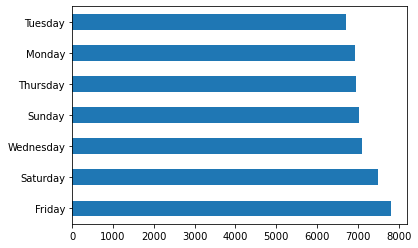

In [68]:
# Since this dataset is only one category of incidents, let's explore some of the other variables
# Visualize the frequency of days of the week that Larceny Theft incidents are reported
df_crime_LT['incident_day_of_week'].value_counts().plot.barh()

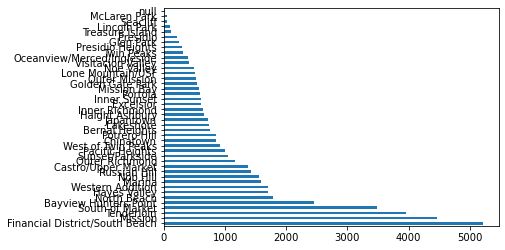

In [69]:
# How about taking a look at neighborhoods where Larceny Theft is most common
# How can I increase the space between the y-axis tick marks ?
df_crime_LT['analysis_neighborhood'].value_counts().plot.barh()
ax.tick_params(axis='y', which='major', pad=15, labelsize=3)

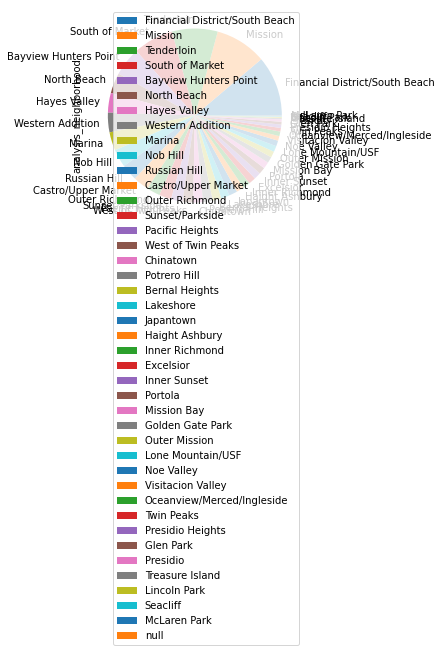

In [70]:
# Create a pie chart to show share of Larceny Theft reports by neighborhood 
# Can't get legend to move
df_crime_LT['analysis_neighborhood'].value_counts().plot.pie(legend = True)

In [71]:
# Generate some basic descriptive statistics
# We know that of all the neighborhoods, Financial District/South Beach has the most reported incidents of Larceny Theft with 5,212 reports
# There are 42 unique neighborhoods in the dataset
df_crime_LT['analysis_neighborhood'].describe()

count                              46585
unique                                42
top       Financial District/South Beach
freq                                5212
Name: analysis_neighborhood, dtype: object

In [72]:
# Let's group the data by neighborhood
df_crime_LT.groupby(['analysis_neighborhood']).count()

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,latitude,longitude,point,geometry
analysis_neighborhood,,,,,,,,,,,
Bayview Hunters Point,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457
Bernal Heights,746,746,746,746,746,746,746,746,746,746,746
Castro/Upper Market,1372,1372,1372,1372,1372,1372,1372,1372,1372,1372,1372
Chinatown,847,847,847,847,847,847,847,847,847,847,847
Excelsior,608,608,608,608,608,608,608,608,608,608,608
Financial District/South Beach,5212,5212,5212,5212,5212,5212,5212,5212,5212,5212,5212
Glen Park,242,242,242,242,242,242,242,242,242,242,242
Golden Gate Park,533,533,533,533,533,533,533,533,533,533,533
Haight Ashbury,654,654,654,654,654,654,654,654,654,654,654


In [73]:
# Create a dataframe grouped by neighborhood and day of the week that the incident occurred 
df_crime_LT_grouped=df_crime_LT.groupby(['analysis_neighborhood','incident_day_of_week']).count()
[['incident_id']]
df_crime_LT_grouped.head(50)

incident_datetime  \
analysis_neighborhood          incident_day_of_week                      
Bayview Hunters Point          Friday                              407   
                               Monday                              320   
                               Saturday                            347   
                               Sunday                              306   
                               Thursday                            371   
                               Tuesday                             315   
                               Wednesday                           391   
Bernal Heights                 Friday                              112   
                               Monday                              114   
                               Saturday                            110   
                               Sunday                               81   
                               Thursday                            121   
                               Tuesday                             106   
                               Wednesday                           102   
Castro/Upper Market            Friday                              206   
                               Monday                              178   
                               Saturday                            190   
                               Sunday                              231   
                               Thursday                            187   
                               Tuesday                             200   
                               Wednesday                           180   
Chinatown                      Friday                              118   
                               Monday                              123   
                               Saturday                            148   
                               Sunday                              110   
                               Thursday                            115   
                               Tuesday                             115   
                               Wednesday                           118   
Excelsior                      Friday                              109   
                               Monday                               80   
                               Saturday                             82   
                               Sunday                               89   
                               Thursday                             66   
                               Tuesday                              80   
                               Wednesday                           102   
Financial District/South Beach Friday                              829   
                               Monday                              704   
                               Saturday                            813   
                               Sunday                              690   
                               Thursday                            777   
                               Tuesday                             670   
                               Wednesday                           729   
Glen Park                      Friday                               40   
                               Monday                               36   
                               Saturday                             39   
                               Sunday                               33   
                               Thursday                             28   
                               Tuesday                              36   
                               Wednesday                            30   
Golden Gate Park               Friday                               82   

                                                     incident_category  \
analysis_neighborhood          incident_day_of_week                      
Bayview Hunters Point          Friday                   

In [74]:
# Let's convert that new dataframe to a more familiar looking format
df_crime_LT_flat=df_crime_LT_grouped.reset_index()
df_crime_LT_flat

,analysis_neighborhood,incident_day_of_week,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_id,latitude,longitude,point,geometry
0,Bayview Hunters Point,Friday,407,407,407,407,407,407,407,407,407,407
1,Bayview Hunters Point,Monday,320,320,320,320,320,320,320,320,320,320
2,Bayview Hunters Point,Saturday,347,347,347,347,347,347,347,347,347,347
3,Bayview Hunters Point,Sunday,306,306,306,306,306,306,306,306,306,306
4,Bayview Hunters Point,Thursday,371,371,371,371,371,371,371,371,371,371
...,...,...,...,...,...,...,...,...,...,...,...,...
288,null,Monday,1,1,1,1,1,1,1,1,1,1
289,null,Saturday,2,2,2,2,2,2,2,2,2,2
290,null,Thursday,1,1,1,1,1,1,1,1,1,1
291,null,Tuesday,1,1,1,1,1,1,1,1,1,1


In [75]:
# Checking again to see what the unique neighborhoods are and the number of times they were reported to have a Larceny Theft incident
df_crime_LT['analysis_neighborhood'].value_counts()

Financial District/South Beach    5212
Mission                           4460
Tenderloin                        3955
South of Market                   3488
Bayview Hunters Point             2457
North Beach                       1779
Hayes Valley                      1696
Western Addition                  1694
Marina                            1592
Nob Hill                          1550
Russian Hill                      1422
Castro/Upper Market               1372
Outer Richmond                    1161
Sunset/Parkside                   1044
Pacific Heights                   1001
West of Twin Peaks                 915
Chinatown                          847
Potrero Hill                       845
Bernal Heights                     746
Lakeshore                          730
Japantown                          726
Haight Ashbury                     654
Inner Richmond                     633
Excelsior                          608
Inner Sunset                       598
Portola                  

In [76]:
# Have to create a new column in a new dataframe called "count" that runs the .value_counts() function for analysis_neighborhood
df_crime_LT_count=df_crime_multiple.groupby(['analysis_neighborhood','incident_day_of_week'])['incident_id'].count().reset_index(name="count")
df_crime_LT_count.head(5)

,analysis_neighborhood,incident_day_of_week,count
0,Bayview Hunters Point,Friday,349
1,Bayview Hunters Point,Monday,303
2,Bayview Hunters Point,Saturday,304
3,Bayview Hunters Point,Sunday,264
4,Bayview Hunters Point,Thursday,319


In [77]:
# Create a bar chart that shows the number of Larceny Theft incidents reported by neighborhood and broken down further by day of the week the incident occurred
px.bar(df_crime_LT_count,
      x='analysis_neighborhood',
       y='count',
       color='incident_day_of_week',
      title='Number of Larceny Theft Reports by Neighborhood in SF County',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_day_of_week':'Day of the Week'})

#### Dataset on crime types excluding larceny theft 
Let's explore the dataset that has multiple incident categories, excluding Larceny Theft.

In [78]:
# Check dimensions
df_crime_multiple.shape

(25564, 27)

In [79]:
# Generate some descriptive statistics 
# We know that of these categories, assault is the most common with 8,892 reports
df_crime_multiple['incident_category'].describe()

count       25564
unique         10
top       Assault
freq         8892
Name: incident_category, dtype: object

In [80]:
# Some general info on the dataset
df_crime_multiple.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25564 entries, 0 to 25563
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   incident_datetime        25564 non-null  object  
 1   incident_date            25564 non-null  object  
 2   incident_time            25564 non-null  object  
 3   incident_year            25564 non-null  object  
 4   incident_day_of_week     25564 non-null  object  
 5   report_datetime          25564 non-null  object  
 6   row_id                   25564 non-null  object  
 7   incident_id              25564 non-null  object  
 8   incident_number          25564 non-null  object  
 9   cad_number               24699 non-null  object  
 10  report_type_code         25564 non-null  object  
 11  report_type_description  25564 non-null  object  
 12  incident_code            25564 non-null  object  
 13  incident_category        25564 non-null  object  
 14  incide

In [81]:
# Once again, need to convert latitude and longitude to floats for future mapping
df_crime_multiple['latitude'] = df_crime_multiple['latitude'].astype(float)
df_crime_multiple['longitude'] = df_crime_multiple['longitude'].astype(float)
df_crime_multiple.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25564 entries, 0 to 25563
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   incident_datetime        25564 non-null  object  
 1   incident_date            25564 non-null  object  
 2   incident_time            25564 non-null  object  
 3   incident_year            25564 non-null  object  
 4   incident_day_of_week     25564 non-null  object  
 5   report_datetime          25564 non-null  object  
 6   row_id                   25564 non-null  object  
 7   incident_id              25564 non-null  object  
 8   incident_number          25564 non-null  object  
 9   cad_number               24699 non-null  object  
 10  report_type_code         25564 non-null  object  
 11  report_type_description  25564 non-null  object  
 12  incident_code            25564 non-null  object  
 13  incident_category        25564 non-null  object  
 14  incide

In [82]:
# How many reports are there for each category?
df_crime_multiple['incident_category'].value_counts()

Assault                8892
Burglary               6042
Motor Vehicle Theft    5389
Robbery                3455
Weapons Offense         777
Sex Offense             445
Arson                   313
Vandalism               198
Rape                     38
Homicide                 15
Name: incident_category, dtype: int64

In [83]:
# How about how many reports there are for each neighborhood?
df_crime_multiple['analysis_neighborhood'].value_counts()

Mission                           2924
Tenderloin                        2479
South of Market                   2382
Financial District/South Beach    2241
Bayview Hunters Point             2138
Castro/Upper Market                819
Nob Hill                           813
Western Addition                   749
Sunset/Parkside                    678
Hayes Valley                       622
Bernal Heights                     556
West of Twin Peaks                 539
North Beach                        536
Marina                             512
Excelsior                          499
Outer Richmond                     477
Potrero Hill                       451
Russian Hill                       439
Chinatown                          432
Pacific Heights                    423
Outer Mission                      422
Portola                            407
Haight Ashbury                     370
Visitacion Valley                  353
Mission Bay                        350
Inner Richmond           

In [84]:
# How about the number of reports for incidents that occurred on each day of the week?
df_crime_multiple['incident_day_of_week'].value_counts()

Friday       3840
Tuesday      3702
Saturday     3675
Monday       3653
Wednesday    3620
Thursday     3613
Sunday       3461
Name: incident_day_of_week, dtype: int64

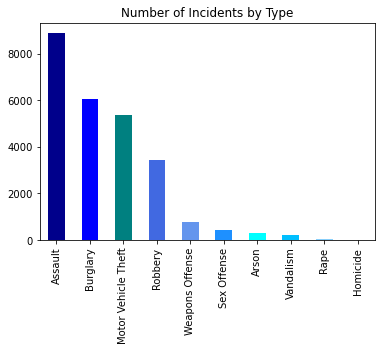

In [85]:
# Plot the number of incidents per category
df_crime_multiple['incident_category'].value_counts().plot.bar(title = 'Number of Incidents by Type', color=['darkblue','blue','teal','royalblue','cornflowerblue','dodgerblue','aqua','deepskyblue','lightskyblue','lightblue'])

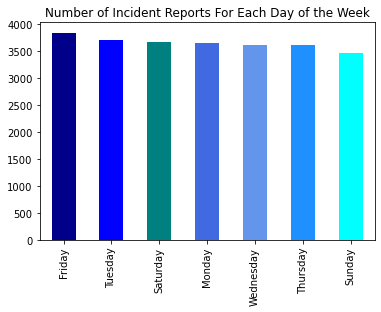

In [86]:
# Plot how many incident reports there were for each day of the week 
df_crime_multiple['incident_day_of_week'].value_counts().plot.bar(title = 'Number of Incident Reports For Each Day of the Week', color=['darkblue','blue','teal','royalblue','cornflowerblue','dodgerblue','aqua'])

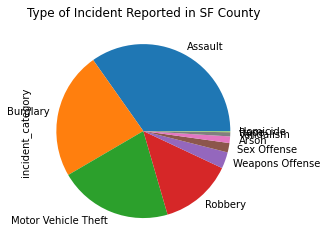

In [87]:
# Create a pie char for the type of incidents reported
df_crime_multiple['incident_category'].value_counts().plot.pie(title='Type of Incident Reported in SF County')

In [88]:
# Just curious...what date has the most incidents reported?
# June 11, 2019 followed closely by April 8, 2019...I wonder why 
df_crime_multiple['incident_date'].value_counts()

2019-06-11T00:00:00.000    103
2019-04-08T00:00:00.000    102
2019-08-20T00:00:00.000     96
2019-05-24T00:00:00.000     95
2019-08-05T00:00:00.000     94
                          ... 
2019-05-02T00:00:00.000     45
2019-09-30T00:00:00.000     45
2019-12-25T00:00:00.000     44
2019-02-11T00:00:00.000     42
2019-02-17T00:00:00.000     42
Name: incident_date, Length: 365, dtype: int64

In [89]:
# Drop any irrelevant columns
desired_columns = ['incident_datetime', 'incident_category','incident_date','incident_time','incident_year','incident_day_of_week','incident_id','analysis_neighborhood','latitude','longitude','point','geometry']
df_crime_multiple[desired_columns]

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-05-01T15:40:00.000,Sex Offense,2019-05-01T00:00:00.000,15:40,2019,Wednesday,949751,South of Market,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",POINT (-122.40364 37.77516)
1,2019-12-11T00:00:00.000,Sex Offense,2019-12-11T00:00:00.000,00:00,2019,Wednesday,949761,South of Market,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",POINT (-122.40364 37.77516)
2,2019-03-21T17:45:00.000,Robbery,2019-03-21T00:00:00.000,17:45,2019,Thursday,952122,Bernal Heights,37.746492,-122.420358,"{'latitude': '37.74649204457983', 'longitude':...",POINT (-122.42036 37.74649)
3,2019-08-09T00:00:00.000,Motor Vehicle Theft,2019-08-09T00:00:00.000,00:00,2019,Friday,954737,South of Market,37.777372,-122.399763,"{'latitude': '37.77737199450485', 'longitude':...",POINT (-122.39976 37.77737)
4,2019-09-01T07:00:00.000,Burglary,2019-09-01T00:00:00.000,07:00,2019,Sunday,955346,Western Addition,37.778006,-122.436697,"{'latitude': '37.77800639742713', 'longitude':...",POINT (-122.43670 37.77801)
...,...,...,...,...,...,...,...,...,...,...,...,...
25559,2019-09-15T23:00:00.000,Assault,2019-09-15T00:00:00.000,23:00,2019,Sunday,946148,Bayview Hunters Point,37.723447,-122.400073,"{'latitude': '37.72344678051801', 'longitude':...",POINT (-122.40007 37.72345)
25560,2019-12-27T17:00:00.000,Robbery,2019-12-27T00:00:00.000,17:00,2019,Friday,947562,North Beach,37.799704,-122.407395,"{'latitude': '37.79970367508504', 'longitude':...",POINT (-122.40740 37.79970)
25561,2019-12-28T18:00:00.000,Motor Vehicle Theft,2019-12-28T00:00:00.000,18:00,2019,Saturday,949291,Haight Ashbury,37.767665,-122.450335,"{'latitude': '37.76766488028409', 'longitude':...",POINT (-122.45033 37.76766)
25562,2019-04-28T13:00:00.000,Motor Vehicle Theft,2019-04-28T00:00:00.000,13:00,2019,Sunday,950819,Sunset/Parkside,37.744681,-122.481181,"{'latitude': '37.744681182378415', 'longitude'...",POINT (-122.48118 37.74468)


In [90]:
# Create a new dataframe with the relevant columns
df_crime_multiple=df_crime_multiple[desired_columns]
df_crime_multiple.head(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
0,2019-05-01T15:40:00.000,Sex Offense,2019-05-01T00:00:00.000,15:40,2019,Wednesday,949751,South of Market,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",POINT (-122.40364 37.77516)
1,2019-12-11T00:00:00.000,Sex Offense,2019-12-11T00:00:00.000,00:00,2019,Wednesday,949761,South of Market,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",POINT (-122.40364 37.77516)
2,2019-03-21T17:45:00.000,Robbery,2019-03-21T00:00:00.000,17:45,2019,Thursday,952122,Bernal Heights,37.746492,-122.420358,"{'latitude': '37.74649204457983', 'longitude':...",POINT (-122.42036 37.74649)
3,2019-08-09T00:00:00.000,Motor Vehicle Theft,2019-08-09T00:00:00.000,00:00,2019,Friday,954737,South of Market,37.777372,-122.399763,"{'latitude': '37.77737199450485', 'longitude':...",POINT (-122.39976 37.77737)
4,2019-09-01T07:00:00.000,Burglary,2019-09-01T00:00:00.000,07:00,2019,Sunday,955346,Western Addition,37.778006,-122.436697,"{'latitude': '37.77800639742713', 'longitude':...",POINT (-122.43670 37.77801)


In [91]:
# Plot the type of incident 
# Not sure why it's not showing up
px.bar(df_crime_multiple,
      x='incident_category',
      title='Number of Incident Reports by Neighborhood in SF County',
      labels={'incident_category':'Type of Incident'})

In [92]:
# Let's try grouping the data then plotting
# Group data by incident type and generate the count
df_crime_multiple.groupby(['incident_category']).count()

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
incident_category,,,,,,,,,,,
Arson,313,313,313,313,313,313,312,312,312,312,313
Assault,8892,8892,8892,8892,8892,8892,8851,8851,8851,8851,8892
Burglary,6042,6042,6042,6042,6042,6042,5946,5946,5946,5946,6042
Homicide,15,15,15,15,15,15,14,14,14,14,15
Motor Vehicle Theft,5389,5389,5389,5389,5389,5389,5298,5298,5298,5298,5389
Rape,38,38,38,38,38,38,38,38,38,38,38
Robbery,3455,3455,3455,3455,3455,3455,3426,3426,3426,3426,3455
Sex Offense,445,445,445,445,445,445,432,432,432,432,445
Vandalism,198,198,198,198,198,198,198,198,198,198,198


In [93]:
# Group by incident type and generate a count
df_crime_multiple.groupby(['incident_category'])['incident_id'].transform('count')

0         445
1         445
2        3455
3        5389
4        6042
         ... 
25559    8892
25560    3455
25561    5389
25562    5389
25563    5389
Name: incident_id, Length: 25564, dtype: int64

In [94]:
# Actually, group by incident type and neighborhood, and generate a new column for the count
df_crime_multiple_count=df_crime_multiple.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")

In [95]:
# What does the dataframe look like now?
df_crime_multiple_count.sample(5)

,incident_category,analysis_neighborhood,count
11,Arson,Lakeshore,3
134,Motor Vehicle Theft,Golden Gate Park,46
60,Assault,Pacific Heights,62
120,Homicide,Japantown,1
85,Burglary,Hayes Valley,209


In [96]:
# Plot the grouped dataframe with the count and color by type of incident 
px.bar(df_crime_multiple_count,
       x='analysis_neighborhood',
       y='count',
       color='incident_category',
       title='Types of Police Incident Reports in SF County by Neighborhood',
      labels={'incident_category':'Type of Incident', 'count':'Count'})

In [97]:
df_crime_combined = df_crime_LT.append(df_crime_multiple, ignore_index = True) 

In [98]:
df_crime_combined.sample(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point,geometry
6282,2019-02-05T19:00:00.000,Larceny Theft,2019-02-05T00:00:00.000,19:00,2019,Tuesday,767093,Hayes Valley,37.775626,-122.432830,"{'latitude': '37.77562608768549', 'longitude':...",POINT (-122.43283 37.77563)
59737,2019-05-25T15:00:00.000,Burglary,2019-05-25T00:00:00.000,15:00,2019,Saturday,806136,Hayes Valley,37.777602,-122.424809,"{'latitude': '37.777601861095036', 'longitude'...",POINT (-122.42481 37.77760)
70591,2019-10-26T02:43:00.000,Burglary,2019-10-26T00:00:00.000,02:43,2019,Saturday,863376,Bayview Hunters Point,37.739609,-122.385835,"{'latitude': '37.739609015794265', 'longitude'...",POINT (-122.38583 37.73961)
55415,2019-03-26T19:00:00.000,Burglary,2019-03-26T00:00:00.000,19:00,2019,Tuesday,783996,Hayes Valley,37.776416,-122.422883,"{'latitude': '37.776415816714724', 'longitude'...",POINT (-122.42288 37.77642)
37433,2019-07-20T14:20:00.000,Larceny Theft,2019-07-20T00:00:00.000,14:20,2019,Saturday,824961,Outer Richmond,37.780440,-122.477240,"{'latitude': '37.78043963553152', 'longitude':...",POINT (-122.47724 37.78044)


# Contributions
Sara T. led the data exploration on for the dataset on incident reports from the San Francisco Police Department. She queried the data from the SF government's API and created three datasets to explore. She managed to bring together two datasets into one Geopandas plot to represent all the incidents reported to the SF Police Department in 2019. This data was then used to generate the interactive kepler map 